<a href="https://colab.research.google.com/github/Nikdenof/DLSdetect/blob/main/SSD_colab_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Aircraft detection project
Целью проекта является создание модели для детекции военных самолетов, в качестве детектора используем SSD300 на базе VGG, так как в теории она обеспечивает детекцию в реальном времени (>= 30 FPS). Для формирования тренировочной, валидационной и тестовой выборки используется [датасет с платформы Kaggle](https://https://www.kaggle.com/a2015003713/militaryaircraftdetectiondataset).




---
### Путь примениния в реальной задаче

Данная модель может быть использована, как дополнительный канал управления для зенитных ракет, при ситуации помех, вызванных противодействием вражеской техники. Поэтому необходимо протестировать работу модели на различных видео с военными самолетами, чтобы определить качество детекции.

## Загрузка необходимых библиотек

In [ ]:
!pip install -q kaggle --quiet
!pip install albumentations==1.1.0 --quiet
!pip uninstall -y opencv-python-headless==4.5.5.62 --quiet
!pip install opencv-python-headless==4.5.2.52 --quiet
!pip install ipython-autotime --quiet
!pip install -U kora --quiet

     |████████████████████████████████| 102 kB 4.4 MB/s 
     |████████████████████████████████| 47.7 MB 83 kB/s 
     |████████████████████████████████| 38.2 MB 1.4 MB/s 
     |████████████████████████████████| 57 kB 2.6 MB/s 
     |████████████████████████████████| 56 kB 4.0 MB/s 


In [ ]:
#working with files
import os
import shutil
import glob
from pathlib import Path
import copy

#visualization and utils
from tqdm.autonotebook import tqdm, trange
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
import random
import time
from collections import Counter, defaultdict
from operator import itemgetter
import datetime
from tensorflow import summary


#importing images and video
import cv2
from google.colab.patches import cv2_imshow
from PIL import Image, ImageDraw, ImageFont
from kora.drive import upload_public
from IPython.display import HTML

#torch
import torch
import torchvision.transforms.functional as F
from torchvision import datasets, models, transforms
from torchvision.transforms.functional import convert_image_dtype
from torchvision.utils import draw_bounding_boxes
from torchvision.utils import make_grid
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torch.utils.tensorboard import SummaryWriter
from torchvision.io import read_image, read_file

#transforms
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2



time: 50.5 ms (started: 2022-02-15 18:55:49 +00:00)


In [ ]:
%load_ext autotime

time: 97.3 µs (started: 2022-02-15 18:55:05 +00:00)


## Загрузка необходимых файлов

### Шрифт

Загрузим шрифт для отображения классов в каждом из bounding box.

In [ ]:
!gdown https://drive.google.com/uc?id=1xu3OEhM5yiqIcHRk5O0aYCXE9Vk_GBMg

Downloading...
From: https://drive.google.com/uc?id=1xu3OEhM5yiqIcHRk5O0aYCXE9Vk_GBMg
To: /content/arial.ttf
100% 767k/767k [00:00<00:00, 113MB/s]
time: 2.18 s (started: 2022-02-15 19:14:38 +00:00)


### Датасет

Загрузим изначальный датасет с платформы Kaggle и распределим его по папкам

In [ ]:
# #If you want to download the kaggle dataset, uncomment the lines below and upload your kaggle.json
# Если хотите скачать датасет, то раскомментируйте линии ниже и загрузите свой kaggle.json
# from google.colab import files
# files.upload()#upload kaggle.json
# ! mkdir ~/.kaggle
# ! cp kaggle.json ~/.kaggle/
# ! chmod 600 ~/.kaggle/kaggle.json
# !kaggle datasets download -d a2015003713/militaryaircraftdetectiondataset --unzip

In [ ]:
# As I have uploaded it on my google drive I can just do it like this
!mkdir ~/.kaggle
!cp /content/drive/MyDrive/kaggle.json ~/.kaggle/kaggle.json

time: 1.04 s (started: 2022-02-15 19:14:45 +00:00)


In [ ]:
!kaggle datasets download -d a2015003713/militaryaircraftdetectiondataset --unzip

100% 3.91G/3.91G [02:06<00:00, 58.3MB/s]
100% 3.91G/3.91G [02:06<00:00, 33.1MB/s]
time: 2min 56s (started: 2022-02-15 19:14:47 +00:00)


In [ ]:
with os.scandir('/content') as entries:
    for entry in entries:
        print(entry.name)

.config
annotated
uc?export=download
drive
dataset
smt.mp4
arial.ttf
yolov5_detections
sample_data
time: 11.9 ms (started: 2022-02-15 19:17:44 +00:00)


In [ ]:
os.rename('dataset/', 'data/')

time: 1.25 ms (started: 2022-02-15 19:17:44 +00:00)


In [ ]:
os.rename('annotated/', 'ann/')

time: 1.63 ms (started: 2022-02-15 19:17:44 +00:00)


In [ ]:
trash_dir = '/content/yolov5_detections'
try:
    shutil.rmtree(trash_dir)
except OSError as e:
    print(f'Error: {trash_dir} : {e.strerror}')

time: 56.6 ms (started: 2022-02-15 19:17:44 +00:00)


In [ ]:
csv_paths = glob.glob('/content/data/dataset/*.csv')
jpg_paths = glob.glob('/content/data/dataset/*.jpg')
csv_paths.sort()
jpg_paths.sort()

time: 53.5 ms (started: 2022-02-15 19:17:44 +00:00)


In [ ]:
print(len(csv_paths), len(jpg_paths))
n_images = len(csv_paths)

5105 5105
time: 2.36 ms (started: 2022-02-15 19:17:44 +00:00)


In [ ]:
os.makedirs('data/images', exist_ok=True)
os.makedirs('data/labels', exist_ok=True)

time: 2.69 ms (started: 2022-02-15 19:17:44 +00:00)


In [ ]:
for i, (csv_path, jpg_path) in enumerate(zip(csv_paths, jpg_paths)):
  shutil.copy(jpg_path, 'data/images/' + os.path.basename(jpg_path))
  shutil.copy(csv_path, 'data/labels/' + os.path.basename(csv_path))

time: 12.9 s (started: 2022-02-15 19:17:44 +00:00)


In [ ]:
root_directory = '/content/data/'
images_directory = os.path.join(root_directory, "images")
labels_directory = os.path.join(root_directory, "labels")

time: 2.5 ms (started: 2022-02-15 19:17:57 +00:00)


In [ ]:
basepath = images_directory
for entry in os.listdir(basepath):
    if os.path.isdir(os.path.join(basepath, entry)):
        print(entry)
        shutil.rmtree(os.path.join(basepath, entry))

time: 50.3 ms (started: 2022-02-15 19:17:57 +00:00)


In [ ]:
basepath = labels_directory
for entry in os.listdir(basepath):
    if os.path.isdir(os.path.join(basepath, entry)):
        print(entry)
        shutil.rmtree(os.path.join(basepath, entry))

time: 55.9 ms (started: 2022-02-15 19:17:57 +00:00)


In [ ]:
images_filenames = list(sorted(os.listdir(images_directory)))
labels_filenames = list(sorted(os.listdir(labels_directory)))

time: 16.9 ms (started: 2022-02-15 19:17:57 +00:00)


In [ ]:
print(len(images_filenames),len(labels_filenames))

5105 5105
time: 1.45 ms (started: 2022-02-15 19:17:57 +00:00)


In [ ]:
random.seed(42)
random.shuffle(images_filenames)

time: 13.9 ms (started: 2022-02-15 19:17:57 +00:00)


In [ ]:
train_images_filenames = images_filenames[:4300]
val_images_filenames = images_filenames[4300:-10]
test_images_filenames = images_filenames[-10:]

print(len(train_images_filenames), len(val_images_filenames), len(test_images_filenames))

4300 795 10
time: 5.28 ms (started: 2022-02-15 19:17:57 +00:00)


In [ ]:
# p = Path('/content/drive/MyDrive/SSD Model weights/utils')
# try:
#     p.mkdir()
# except FileExistsError as exc:
#     print(exc)

## Загрузка модели для детекции
В качестве фрейворка используем набор стандартных моделей из `torchvision.models.detection`, так как в отличии от других фреймворков, эти модели без особых изменений, из необходимиых функций в них реализованы IOU, NMS и функции потерь. На выходе из модели при инференсе тензоры с координатами box, labels и вероятности классов.

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print('Для обучения и валидации используем -', device)

Для обучения и валидации используем - cuda
time: 6.99 ms (started: 2022-02-15 19:20:14 +00:00)


Импортируем модель из стандартной библиотеки предобученную на датасете COCO, состоящий из 91 класса (включая background).

In [ ]:
model = models.detection.ssd300_vgg16(pretrained=True)

In [ ]:
model = model.to(device)

Загрузим обозначения для датасета COCO, к каждому из классов выберем цвет bounding box выбранных из [набора](https://www.december.com/html/spec/colorsafecodes.html).

In [ ]:
coco = (
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
    'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
    'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
    'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
    'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table',
    'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
    'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book',
    'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
    )
       
label_map = {k: v for v, k in enumerate(coco)}
rev_label_map = {v: k for k, v in label_map.items()}


distinct_colors = ['#e6194b', '#3cb44b', '#ffe119', '#0082c8', '#f58231', '#911eb4', '#46f0f0', '#f032e6',
                   '#d2f53c', '#fabebe', '#008080', '#000080', '#aa6e28', '#fffac8', '#800000', '#aaffc3', '#808000',
                   '#ffd8b1', '#e6beff', '#808080', '#ffffff', '#996666', '#663333', '#cc0000', '#ff9999', '#cc3300',
                   '#cc6633', '#ff6600', '#663300', '#ff9933', '#cc9900', '#999966', '#cccc66', '#cccc00', '#ffff33',
                   '#ffff99', '#99cc00', '#669900', '#99cc66', '#99FF33', '#99ffcc', '#33cc99', '#33ffcc', '#669999',
                   '#339999', '#003333', '#ccffff', '#3399cc', '#0099ff', '#0066ff', '#6699ff', '#0000ff', '#3300cc',
                   '#d2f53c', '#fabebe', '#008080', '#000080', '#aa6e28', '#fffac8', '#800000', '#aaffc3', '#808000',
                   '#ffd8b1', '#e6beff', '#808080', '#ffffff', '#996666', '#663333', '#cc0000', '#ff9999', '#cc3300',
                   '#cc6633', '#ff6600', '#663300', '#ff9933', '#cc9900', '#999966', '#cccc66', '#cccc00', '#ffff33',
                   '#339999', '#003333', '#ccffff', '#3399cc', '#0099ff', '#0066ff', '#6699ff', '#0000ff', '#3300cc',
                   '#ff00CC', '#ff3399']
label_color_map = {k: distinct_colors[i] for i, k in enumerate(label_map.keys())}

#if you want to check if the number of classes fits the coco dataset
# print(len(rev_label_map))
# print(len(label_color_map))

time: 35.9 ms (started: 2022-02-15 19:17:57 +00:00)


## Inference предобученной модели

In [ ]:
!gdown https://drive.google.com/uc?id=1WPKH1um9TMh8EYtqTZu09BmWbVa7DwvR

Downloading...
From: https://drive.google.com/uc?id=1WPKH1um9TMh8EYtqTZu09BmWbVa7DwvR
To: /content/jas39.jpg
100% 71.8k/71.8k [00:00<00:00, 40.7MB/s]
time: 2.52 s (started: 2022-02-15 19:17:57 +00:00)


In [ ]:
image = Image.open('jas39.jpg', mode='r')
image = image.convert('RGB')

time: 48.8 ms (started: 2022-02-15 19:18:00 +00:00)


In [110]:
trans = transforms.Compose([transforms.ToTensor()])

def eval_bb(model, image_or, score_threshold):
  model.eval()
  image = trans(image_or)
  image = image.to(device)
  image = torch.unsqueeze(image, 0)
  output = model(image)[0]
  det_boxes = output['boxes'][output['scores'] > score_threshold]
  det_labels = output['labels'][output['scores'] > score_threshold]
  det_scores = output['scores'][output['scores'] > score_threshold]
  # Move detections to the CPU
  det_boxes = det_boxes.to('cpu')

  # Decode class integer labels
  det_labels = [rev_label_map[l] for l in det_labels.to('cpu').tolist()]

  if det_labels == ['__background__']:
      return image_or
  det_scores = det_scores.to('cpu').tolist()
  annotated_image = image_or
  draw = ImageDraw.Draw(annotated_image)
  font = ImageFont.truetype("arial.ttf", 15)

  for i in range(det_boxes.size(0)):
    box_location = det_boxes[i].tolist()
    draw.rectangle(xy=box_location, outline=label_color_map[det_labels[i]])
    draw.rectangle(xy=[l + 1. for l in box_location], outline=label_color_map[det_labels[i]])

    # Text
    fulltext = det_labels[i].upper() + '  SCORE: ' + str(round(det_scores[i], 2))
    text_size = font.getsize(fulltext)
    text_location = [box_location[0] + 2., box_location[1] - text_size[1]]
    textbox_location = [box_location[0], box_location[1] - text_size[1], box_location[0] + text_size[0] + 4.,
                            box_location[1]]
    draw.rectangle(xy=textbox_location, fill=label_color_map[det_labels[i]])
    draw.text(xy=text_location, text=fulltext, fill='white',
                  font=font)
  del draw

  return annotated_image

time: 85.4 ms (started: 2022-02-15 20:16:56 +00:00)


In [ ]:
eval_bb(model, image, 0.2)

NameError: ignored

time: 29.4 ms (started: 2022-02-15 19:18:00 +00:00)


### Тестирование Albuminations на одном изображении из датасета

Входные картинки подаются в формате pascal_voc, визуализируем изменения

In [ ]:
#pascal_voc original
bboxes = [[308, 126, 651, 201]]
category_ids = [17]
category_id_to_name = {17: 'Be200'}

time: 14.4 ms (started: 2022-02-13 07:40:28 +00:00)


In [ ]:
BOX_COLOR = (255, 0, 0) # Red
TEXT_COLOR = (255, 255, 255) # White


def visualize_bbox(img, bbox, class_name, color=BOX_COLOR, thickness=2):
    """Visualizes a single bounding box on the image"""
    x_min, y_min, x_max, y_max = map(int, bbox)

    cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=color, thickness=thickness)
    
    ((text_width, text_height), _) = cv2.getTextSize(class_name, cv2.FONT_HERSHEY_SIMPLEX, 0.35, 1)    
    cv2.rectangle(img, (x_min, y_min - int(1.3 * text_height)), (x_min + text_width, y_min), BOX_COLOR, -1)
    cv2.putText(
        img,
        text=class_name,
        org=(x_min, y_min - int(0.3 * text_height)),
        fontFace=cv2.FONT_HERSHEY_SIMPLEX,
        fontScale=0.35, 
        color=TEXT_COLOR, 
        lineType=cv2.LINE_AA,
    )
    return img


def visualize(image, bboxes, category_ids, category_id_to_name):
    img = image.copy()
    for bbox, category_id in zip(bboxes, category_ids):
        class_name = category_id_to_name[category_id]
        img = visualize_bbox(img, bbox, class_name)
    plt.figure(figsize=(12, 12))
    plt.axis('off')
    plt.imshow(img)

time: 17.2 ms (started: 2022-02-15 19:18:12 +00:00)


In [ ]:
image = cv2.imread('/content/data/images/000ec980b5b17156a55093b4bd6004ab.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

time: 18.4 ms (started: 2022-02-13 07:40:32 +00:00)


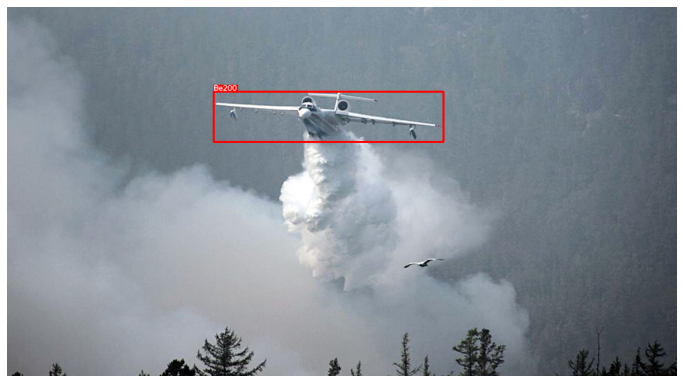

time: 265 ms (started: 2022-02-13 07:40:34 +00:00)


In [ ]:
visualize(image, bboxes, category_ids, category_id_to_name)

In [ ]:
transform = A.Compose([
                       A.Resize(300, 300),
        A.Flip(0.5),         
        A.HorizontalFlip(p=0.5),
        A.ShiftScaleRotate(p=0.5),
        A.RandomBrightnessContrast(p=0.3),
        A.RGBShift(r_shift_limit=30, g_shift_limit=30, b_shift_limit=30, p=0.3),
    ],
    bbox_params=A.BboxParams(format='pascal_voc', label_fields=['category_ids']),
)

time: 6.27 ms (started: 2022-02-13 07:40:38 +00:00)


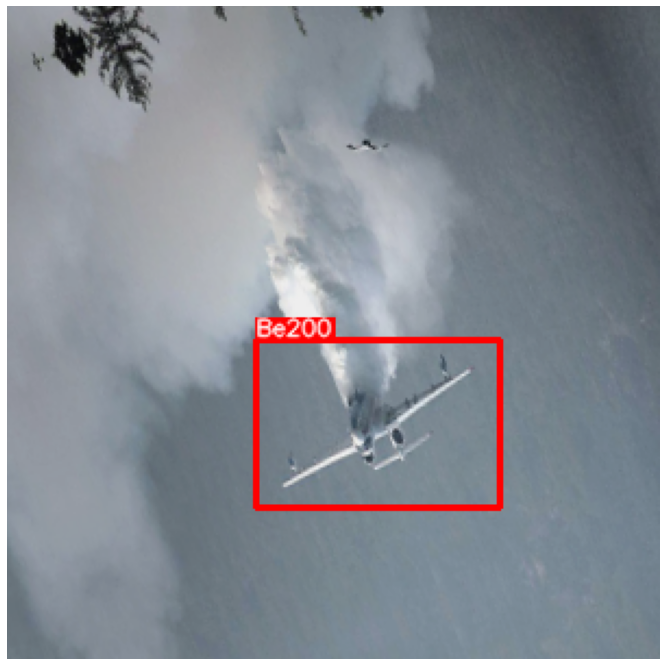

time: 360 ms (started: 2022-02-13 07:40:40 +00:00)


In [ ]:
random.seed(42)
transformed = transform(image=image, bboxes=bboxes, category_ids=category_ids)
visualize(
    transformed['image'],
    transformed['bboxes'],
    transformed['category_ids'],
    category_id_to_name
)

## Формирование датасета

Обозначим лейблы классов, которые присутствуют в датасете

In [ ]:
aircraft_voc = (
    '__background__', 'F16', 'Be200', 'E2', 'Rafale', 'F15', 'B2', 'US2', 'Mig31', 'B1',
       'F35', 'A10', 'Tu160', 'V22', 'F117', 'C5', 'F18', 'C130', 'AG600',
       'SR71', 'F22', 'Tu95', 'YF23', 'XB70', 'F14', 'B52', 'F4', 'C17',
       'MQ9', 'JAS39', 'Mirage2000', 'J20', 'Su57', 'RQ4', 'A400M',
       'EF2000', 'U2'
    )
label_map = {k: v for v, k in enumerate(aircraft_voc)}
rev_label_map = {v: k for k, v in label_map.items()}


distinct_colors = ['#e6194b', '#3cb44b', '#ffe119', '#0082c8', '#f58231', '#911eb4', '#46f0f0', '#f032e6',
                   '#d2f53c', '#fabebe', '#008080', '#000080', '#aa6e28', '#fffac8', '#800000', '#aaffc3', '#808000',
                   '#ffd8b1', '#e6beff', '#808080', '#ffffff', '#996666', '#663333', '#cc0000', '#ff9999', '#cc3300',
                   '#cc6633', '#ff6600', '#663300', '#ff9933', '#cc9900', '#999966', '#cccc66', '#cccc00', '#ffff33',
                   '#ffff99', '#99cc00'
    ]
label_color_map = {k: distinct_colors[i] for i, k in enumerate(label_map.keys())}

# print(len(rev_label_map))
# print(len(label_color_map))
print(len(aircraft_voc))

37
time: 25.7 ms (started: 2022-02-15 19:18:16 +00:00)


In [ ]:
def preprocess_bboxes(input, tensor = False):
  boxes = []
  labels = []
  input = input.to_numpy()
  for i in range(input.shape[0]):
    label = input[i,3]
    box = input[i,4:]
    box = box.tolist()
    boxes.append(box)
    labels.append(label)
  if tensor:
    boxes = torch.FloatTensor(boxes)
    labels = [label_map[l] for l in labels]
    labels =  torch.LongTensor(labels)
  return boxes, labels

time: 11.9 ms (started: 2022-02-15 19:18:18 +00:00)


#### Функция создания датасета

In [ ]:
class AircraftDataset(Dataset):

  #initializing the data
  def __init__(self, images_filenames, images_directory, labels_directory, label_map, transform = None):
    self.images_filenames = images_filenames
    self.images_directory = images_directory
    self.labels_directory = labels_directory
    self.transform = transform
    self.label_map = label_map
    
  #return the data length
  def __len__(self):
    return len(self.images_filenames)

  #returning one item on index
  def __getitem__(self, idx):
    image_filename = self.images_filenames[idx]
    image = cv2.imread(os.path.join(self.images_directory, image_filename))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
    image/=255
    path_label = os.path.join(labels_directory, image_filename.replace(".jpg", ".csv"))
    label = pd.read_csv(path_label, index_col=None, header=0)
    bboxes, class_labels = preprocess_bboxes(label)    
    if self.transform:
      transformed = self.transform(image = image, bboxes = bboxes, category_ids = class_labels)
      image = transformed['image']
      bboxes = transformed['bboxes']
      class_labels = transformed['category_ids']

    target = {}
    num_objs = len(class_labels)
    if num_objs == 0:
      target['boxes'] = torch.zeros((0, 4), dtype=torch.float32)
    else:
      target['boxes'] = torch.FloatTensor(bboxes)
    class_labels = [self.label_map[l] for l in class_labels]
    target['labels'] = torch.LongTensor(class_labels)

    return image, target

time: 35.9 ms (started: 2022-02-15 19:18:20 +00:00)


## Augmentations

Для того чтобы наша одностадийная модель детекции имела хорошую обобщающую способность и могла хорошо определять классы используем аугментации, которые будут увеличивать тренировочную выборку путем изменения исходных изображений.

Одной из особенностью решаемой проблемы является то, что фотографии летающей техники могут быть с любых ракурсов и в совершенно разных приблежениях, учитывая это возможно применение большинства аугментаций (поворот по осям, отзеркаливание, обрезание по размеру, поворот в некотором интервале, уменьшение масштаба картинки), связанных с пространственным расположением цели детекции.

После проделанных аугментаций изменяем разрешение изображения на (300, 300) чтобы в последствии подать в сеть. На валидациионной выборке просто приводим изображении к нужному масштабу.



---


**ВАЖНО**

При использовании данной модели необходимо на вход подавать тензоры со значениями в интервале от (0,1), но также не надо нормализировать входы, так как это выполняется внутри самой модели.

In [ ]:
train_transform = A.Compose([
                       A.Flip(p=0.2),
                       A.RandomRotate90(p=0.15),
                       A.RandomBrightnessContrast(p=0.4),
                       A.OneOf([
                                A.RandomSizedBBoxSafeCrop(p=0.5, width=300, height=300, erosion_rate=0.3),
                                A.ShiftScaleRotate(p=0.45, shift_limit=(-0.1, 0.1), scale_limit=(-0.4, 0.1), rotate_limit=(-15, 15), border_mode=0),
                                ], p=0.5),
                       A.MotionBlur(p=0.2),
                       A.MedianBlur(blur_limit=3, p=0.1),
                       A.Blur(blur_limit=3, p=0.1),
                       A.Resize(300, 300),
                       ToTensorV2()
                       ],
                       bbox_params=A.BboxParams(format='pascal_voc', label_fields=['category_ids']))
train_dataset = AircraftDataset(train_images_filenames, images_directory, labels_directory, label_map, transform=train_transform)

time: 15.9 ms (started: 2022-02-15 19:18:22 +00:00)


In [ ]:
val_transform = A.Compose([
                     A.Resize(300, 300),
                     ToTensorV2()
                     ],
                    bbox_params=A.BboxParams(format='pascal_voc', label_fields=['category_ids']),
                    )
val_dataset = AircraftDataset(val_images_filenames, images_directory, labels_directory, label_map, transform=val_transform)

time: 5.11 ms (started: 2022-02-15 19:18:23 +00:00)


#### Визуализируем изменения

In [ ]:
def viz(dataset, idx=0):
    dataset = copy.deepcopy(dataset)
    image, mask = dataset[idx]
    sample = image.permute(1, 2, 0).cpu().numpy()
    det_boxes = mask['boxes']
    det_boxes = det_boxes.cpu().detach().numpy()
    det_labels = mask['labels']
    det_labels = det_labels.cpu().detach().numpy()
    visualize(sample, det_boxes, det_labels, rev_label_map)

time: 4.12 ms (started: 2022-02-15 19:18:26 +00:00)


На применненные аугментации можно посмотреть ниже

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


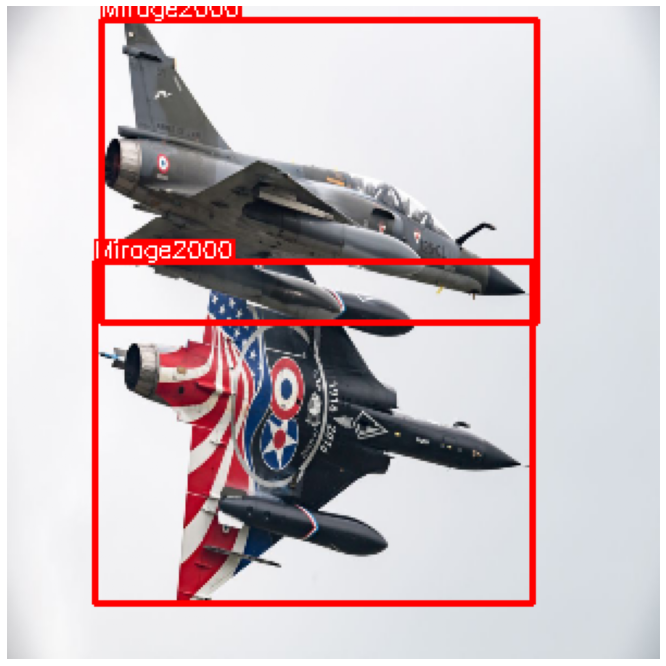

time: 428 ms (started: 2022-02-13 07:41:01 +00:00)


In [ ]:
# random.seed(42)
viz(train_dataset, idx = random.randrange(4000))

In [ ]:
def visualize_augmentations(dataset, idx=0, samples=3):
    figure, ax = plt.subplots(nrows=samples, ncols=2, figsize=(24, 24))
    dataset = copy.deepcopy(dataset)
    for i in range(samples):
      image, mask = dataset[idx]
      sample = image.permute(1, 2, 0).cpu().numpy()
      det_boxes = mask['boxes']
      det_boxes = det_boxes.cpu().detach().numpy()
      det_labels = mask['labels']
      det_labels = det_labels.cpu().detach().numpy()
      img = sample.copy()
      for bbox, category_id in zip(det_boxes, det_labels):
        class_name = rev_label_map[category_id]
        img = visualize_bbox(img, bbox, class_name)
      
      x = visualize(sample, det_boxes, det_labels, rev_label_map)
      ax[i, 0].imshow(sample)
      ax[i, 1].imshow(img)
      ax[i, 0].set_title("True image")
      ax[i, 1].set_title("Augmented mask")
      ax[i, 0].set_axis_off()
      ax[i, 1].set_axis_off()
    plt.tight_layout()
    plt.show()

time: 22.3 ms (started: 2022-02-15 19:18:28 +00:00)


In [ ]:
random.seed(42)
# visualize_augmentations(train_dataset, idx=64)

time: 1.33 ms (started: 2022-02-15 19:18:33 +00:00)


## Dataloader

In [ ]:
def collate_fn(batch):
    return tuple(zip(*batch))

time: 1.67 ms (started: 2022-02-15 19:18:31 +00:00)


### Oversampling for detection

После нескольких попыток обучить сеть, стало понятно, что существует заметный дизбаланс в классах, в данном разделе визиализируем проблему, после чего воспользуемся техникой Oversampling для решения данной проблемы.

In [ ]:
def max_occurrences_2(seq):
    "defaultdict iteritems"
    c = defaultdict(int)
    for item in seq:
        c[item] += 1
    return max(c.items(), key=itemgetter(1))[0]

time: 1.71 ms (started: 2022-02-13 07:41:16 +00:00)


**Не считать, загрузить ниже**

In [ ]:
distrib = []
for data, labels in train_dataset:
  labels = labels['labels']
  length = labels.size(dim=0)
  listik = []
  for i in range(length):
    label = int(labels[i])
    listik.append(label)
  # print(listik)
  ntd = max_occurrences_2(listik)
  # print('most',ntd)
  distrib.append(ntd)

Для записания на гугл диск

In [ ]:
# with open("/content/drive/MyDrive/SSD Model weights/utils/distrib.txt", "w") as f:
#     for s in distrib:
#         f.write(str(s) +"\n")

Для загрузки с него

In [ ]:
distrib = []
with open("/content/drive/MyDrive/SSD Model weights/utils/distrib.txt", "r") as f:
  for line in f:
    distrib.append(int(line.strip()))
len(distrib)

4300

time: 1.16 s (started: 2022-02-15 19:18:39 +00:00)


На лицо огромный дизбаланс в выбранном датасете, дизбаланс был бы еще больше если учитывать каждое появление самолета на картинке. В таком случае F15 мы бы встретили больше 500 раз, так как много фотографий с несколькими экзэмплярами одновременно.

In [ ]:
det_labels = [rev_label_map[l] for l in distrib]
s = pd.Series(distrib)
b = pd.Series(det_labels)
b = b.value_counts()
b

V22           305
F16           240
F15           196
F35           193
C130          187
US2           187
A10           185
F18           179
B2            159
B1            150
Be200         130
JAS39         128
C5            118
F22           114
C17           111
A400M         108
Rafale        106
F14            95
B52            94
F4             92
Su57           90
E2             90
AG600          88
EF2000         87
J20            87
RQ4            85
SR71           83
Tu160          82
MQ9            75
U2             74
F117           69
Mirage2000     68
XB70           67
Mig31          66
Tu95           58
YF23           54
dtype: int64

time: 83.7 ms (started: 2022-02-15 19:18:42 +00:00)


In [ ]:
d = s.value_counts()
d = d.sort_index()
d = 1/d
d = d.to_list()

time: 14.2 ms (started: 2022-02-15 19:18:42 +00:00)


In [ ]:
print('Присутствуют',len(d), 'классов')

Присутствуют 36 классов
time: 3.05 ms (started: 2022-02-15 19:18:44 +00:00)


Посчитаем количество классов, относительно этого присвоим веса к каждой из картинок

**Результат загрузить ниже, а то считает приличное время**

In [ ]:
# dataset = train_dataset
# sample_weights = [0]*len(dataset)
# class_weights = d

# for idx, (data, labels) in enumerate(dataset):
#     # print('picture number',idx)
#     labels = labels['labels']
#     length = labels.size(dim=0)
#     class_weight = 0
#     # print('number of boxes', length, 'in picture', idx)
#     for i in range(length):
#       # print('box', i)
#       label = int(labels[i])
#       # print('label', label)
#       class_weight += class_weights[label-1]
#       # print('corresponding weight', class_weight)
#     class_weight /= length
#     # print('adjusted weight',class_weight)
#     sample_weights[idx] = class_weight
# # print('len', len(sample_weights))

time: 3.4 ms (started: 2022-02-15 19:18:46 +00:00)


In [ ]:
# with open("/content/drive/MyDrive/SSD Model weights/utils/sample_weights.txt", "w") as f:
#     for s in sample_weights:
#         f.write(str(s) +"\n")

In [ ]:
sample_weights = []
with open("/content/drive/MyDrive/SSD Model weights/utils/sample_weights.txt", "r") as f:
  for line in f:
    sample_weights.append(float(line.strip()))
len(sample_weights)

4300

time: 672 ms (started: 2022-02-15 19:18:51 +00:00)


In [ ]:
len(sample_weights)
sampler = WeightedRandomSampler(sample_weights, num_samples
                                  = len(sample_weights), replacement = True)

time: 4.38 ms (started: 2022-02-15 19:18:52 +00:00)


### Задаем dataloders для обучения и валидации

Не нужно указывать Shuffle на этапе обучения сети так как картинки подаются случайно благодаря WeightedRandomSampler.

In [ ]:
batch_size = 64
train_loader = DataLoader(train_dataset,
                          batch_size=batch_size,
                          sampler = sampler,
                          # shuffle=True,
                          num_workers=2,
                          pin_memory=True,
                          drop_last= True,
                          collate_fn=collate_fn
                          )

time: 3.77 ms (started: 2022-02-15 19:18:55 +00:00)


In [ ]:
val_loader = DataLoader(
        val_dataset,
        batch_size=16,#16
        shuffle=False,
        num_workers=2,
        pin_memory=True,
        drop_last= True,
        collate_fn=collate_fn
    )

time: 3.38 ms (started: 2022-02-15 19:18:56 +00:00)


#### Новое распределения по классам

**Не запускать, загрузить ниже**

In [ ]:
# dist = []
# # for epoch in range(3):
# for data, labels in train_loader:
#     for i in range(len(labels)):
#       label = labels[i]
#       label = label['labels']
#       listik = []
#       for i in range(label.size(dim=0)):
#         lb = int(label[i])
#         listik.append(lb)
#       # ntd = max(listik,key=listik.count)
#       ntd = max_occurrences_2(listik)
#       dist.append(ntd)

In [ ]:
# with open("/content/drive/MyDrive/SSD Model weights/utils/dist.txt", "w") as f:
#     for s in dist:
#         f.write(str(s) +"\n")

In [ ]:
dist = []
with open("/content/drive/MyDrive/SSD Model weights/utils/dist.txt", "r") as f:
  for line in f:
    dist.append(int(line.strip()))
len(dist)

4224

time: 582 ms (started: 2022-02-15 19:19:02 +00:00)


In [ ]:
len(dist)#потому что drop last в батчах

4224

time: 3.6 ms (started: 2022-02-15 19:19:04 +00:00)


In [ ]:
det_labels = [rev_label_map[l] for l in dist]
balance = pd.Series(det_labels)
balance = balance.value_counts()
balance

F4            140
C130          137
F18           136
A400M         130
Mirage2000    129
AG600         128
Be200         127
SR71          126
B52           124
E2            123
A10           123
MQ9           121
F22           119
Rafale        118
C5            117
B1            117
C17           116
US2           116
JAS39         116
Su57          115
RQ4           115
F35           114
F14           113
F117          113
Tu95          112
V22           111
F16           109
B2            109
F15           109
J20           109
EF2000        108
XB70          108
U2            105
Mig31         105
Tu160         104
YF23          102
dtype: int64

time: 13.8 ms (started: 2022-02-15 19:19:06 +00:00)


## Обучение модели - детектора

In [ ]:
model = None

### **Загрузка сохраненной модели**

In [ ]:
#https://drive.google.com/file/d/1MNRnX5XE0nCeMqdjIutTKcIaEk5Wwi21/view?usp=sharing

In [ ]:
FILE = "/content/drive/MyDrive/SSD Model weights/ssdmodel1644766157.623121.pth"

time: 1.12 ms (started: 2022-02-15 19:19:14 +00:00)


In [ ]:
custom_ssd = models.detection.ssd300_vgg16(num_classes = 37)
custom_ssd.load_state_dict(torch.load(FILE))
None

Downloading: "https://download.pytorch.org/models/vgg16_features-amdegroot.pth" to /root/.cache/torch/hub/checkpoints/vgg16_features-amdegroot.pth


  0%|          | 0.00/56.1M [00:00<?, ?B/s]

time: 16.3 s (started: 2022-02-15 19:14:00 +00:00)


In [ ]:
custom_ssd = custom_ssd.to(device)

time: 49.8 ms (started: 2022-02-15 19:20:18 +00:00)


### Загрузка модели без предобучения

In [ ]:
custom_ssd = models.detection.ssd300_vgg16(num_classes = 37)

Downloading: "https://download.pytorch.org/models/vgg16_features-amdegroot.pth" to /root/.cache/torch/hub/checkpoints/vgg16_features-amdegroot.pth


  0%|          | 0.00/56.1M [00:00<?, ?B/s]

In [ ]:
custom_ssd = custom_ssd.to(device)

### Параметры обучения


In [ ]:
epochs = 40
alpha = 1#0.8
lr = 1e-4#1e-3, 5e-4, 1e-4
weight_decay = 0#1e-4,1e-5,0
# optimizer = torch.optim.SGD(custom_ssd.parameters(), lr=0.005, momentum=0.9, weight_decay=0.0005)
optimizer = torch.optim.Adam(custom_ssd.parameters(), lr=lr, weight_decay=weight_decay)
# history = []
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                                   step_size=10,
                                                   gamma=0.5)

time: 5.39 ms (started: 2022-02-15 19:19:22 +00:00)


In [ ]:
def train(train_loader, model, optimizer, alpha, epochs):
  history = []
  globaliter = 0
  pbar = trange(epochs, desc="Epoch:")
  for i in pbar:
      # if i % 5 == 0:
      #     checkpoint = checkpoint = {
      #         "epoch": i,
      #         "model_state": model.state_dict(),
      #         "optim_state": optimizer.state_dict()
      #         }
      #     save_checkpoint
      for images, targets in tqdm(train_loader):
          globaliter += 1
          model.train()
          images = list(image.to(device) for image in images)
          targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
          output = model(images, targets)
          loss_cl = output['classification'] 
          loss_reg = alpha * output['bbox_regression']
          loss = loss_cl + loss_reg

          # loss_dict = model(images, targets)
          # loss = sum(loss for loss in loss_dict.values())

          history.append(loss.item()) 
          optimizer.zero_grad()
          loss.backward()
          optimizer.step()

          with train_summary_writer.as_default():
            summary.scalar('Overall loss', loss.item(), step=globaliter)
            summary.scalar('Classification loss', loss_cl.item(), step=globaliter)
            summary.scalar('Regression loss', loss_reg.item(), step=globaliter)
      

      print(f'{i+1},\t loss: {history[-1]}')

  return model, history

time: 29.3 ms (started: 2022-02-15 19:19:24 +00:00)


### Визуализация Tensorboard

In [ ]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard
time: 1.27 ms (started: 2022-02-13 12:06:23 +00:00)


In [ ]:
current_time = str(datetime.datetime.now().timestamp())
train_log_dir = 'logs/tensorboard/train/' + current_time
test_log_dir = 'logs/tensorboard/test/' + current_time
train_summary_writer = summary.create_file_writer(train_log_dir)
test_summary_writer = summary.create_file_writer(test_log_dir)

time: 71.3 ms (started: 2022-02-13 12:06:24 +00:00)


In [ ]:
%tensorboard --logdir logs/tensorboard

Reusing TensorBoard on port 6006 (pid 584), started 4:14:01 ago. (Use '!kill 584' to kill it.)

<IPython.core.display.Javascript object>

time: 11.6 ms (started: 2022-02-13 12:06:26 +00:00)


### Обучение

In [ ]:
custom_ssd, losses = train(train_loader, custom_ssd, optimizer, alpha, epochs)

Epoch::   0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/67 [00:00<?, ?it/s]

1,	 loss: 2.1005098819732666


  0%|          | 0/67 [00:00<?, ?it/s]

2,	 loss: 2.4421961307525635


  0%|          | 0/67 [00:00<?, ?it/s]

3,	 loss: 2.277475595474243


  0%|          | 0/67 [00:00<?, ?it/s]

4,	 loss: 2.2596323490142822


  0%|          | 0/67 [00:00<?, ?it/s]

5,	 loss: 2.4384517669677734


  0%|          | 0/67 [00:00<?, ?it/s]

6,	 loss: 2.369109630584717


  0%|          | 0/67 [00:00<?, ?it/s]

7,	 loss: 2.071037769317627


  0%|          | 0/67 [00:00<?, ?it/s]

8,	 loss: 1.8260523080825806


  0%|          | 0/67 [00:00<?, ?it/s]

9,	 loss: 2.1595633029937744


  0%|          | 0/67 [00:00<?, ?it/s]

10,	 loss: 2.4398133754730225


  0%|          | 0/67 [00:00<?, ?it/s]

11,	 loss: 2.1393673419952393


  0%|          | 0/67 [00:00<?, ?it/s]

12,	 loss: 2.722724437713623


  0%|          | 0/67 [00:00<?, ?it/s]

13,	 loss: 2.3537845611572266


  0%|          | 0/67 [00:00<?, ?it/s]

14,	 loss: 2.2116050720214844


  0%|          | 0/67 [00:00<?, ?it/s]

15,	 loss: 1.9898133277893066


  0%|          | 0/67 [00:00<?, ?it/s]

16,	 loss: 2.5217807292938232


  0%|          | 0/67 [00:00<?, ?it/s]

17,	 loss: 2.3006882667541504


  0%|          | 0/67 [00:00<?, ?it/s]

18,	 loss: 1.9421045780181885


  0%|          | 0/67 [00:00<?, ?it/s]

19,	 loss: 2.1905479431152344


  0%|          | 0/67 [00:00<?, ?it/s]

20,	 loss: 1.8700627088546753


  0%|          | 0/67 [00:00<?, ?it/s]

21,	 loss: 1.9545692205429077


  0%|          | 0/67 [00:00<?, ?it/s]

22,	 loss: 2.369987964630127


  0%|          | 0/67 [00:00<?, ?it/s]

23,	 loss: 2.0230343341827393


  0%|          | 0/67 [00:00<?, ?it/s]

24,	 loss: 2.0324482917785645


  0%|          | 0/67 [00:00<?, ?it/s]

25,	 loss: 1.918252944946289


  0%|          | 0/67 [00:00<?, ?it/s]

26,	 loss: 1.7259207963943481


  0%|          | 0/67 [00:00<?, ?it/s]

27,	 loss: 2.244758129119873


  0%|          | 0/67 [00:00<?, ?it/s]

28,	 loss: 1.928363561630249


  0%|          | 0/67 [00:00<?, ?it/s]

29,	 loss: 1.7194509506225586


  0%|          | 0/67 [00:00<?, ?it/s]

30,	 loss: 2.3368914127349854


  0%|          | 0/67 [00:00<?, ?it/s]

31,	 loss: 2.039625406265259


  0%|          | 0/67 [00:00<?, ?it/s]

32,	 loss: 1.8650633096694946


  0%|          | 0/67 [00:00<?, ?it/s]

33,	 loss: 1.6267151832580566


  0%|          | 0/67 [00:00<?, ?it/s]

34,	 loss: 1.6438157558441162


  0%|          | 0/67 [00:00<?, ?it/s]

35,	 loss: 1.4957331418991089


  0%|          | 0/67 [00:00<?, ?it/s]

36,	 loss: 1.4530997276306152


  0%|          | 0/67 [00:00<?, ?it/s]

37,	 loss: 1.6455261707305908


  0%|          | 0/67 [00:00<?, ?it/s]

38,	 loss: 2.3753113746643066


  0%|          | 0/67 [00:00<?, ?it/s]

39,	 loss: 1.4973409175872803


  0%|          | 0/67 [00:00<?, ?it/s]

40,	 loss: 1.4158871173858643
time: 3h 22min 30s (started: 2022-02-13 12:06:46 +00:00)


#### Сохранение модели

In [ ]:
current_time = str(datetime.datetime.now().timestamp())
ssd_path = '/content/drive/MyDrive/SSD Model weights/ssdmodel'
ras = ".pth"
FILE = ssd_path + current_time + ras
torch.save(custom_ssd.state_dict(), FILE)

time: 905 ms (started: 2022-02-13 15:29:17 +00:00)


140 эпох

In [ ]:
print('Чекпоинт сохранен в расположении ',FILE)

Чекпоинт сохранен в расположении  /content/drive/MyDrive/SSD Model weights/ssdmodel1644766157.623121.pth
time: 931 µs (started: 2022-02-13 15:29:18 +00:00)


100 эпох

In [ ]:
print('Чекпоинт сохранен в расположении ',FILE)

Чекпоинт сохранен в расположении  /content/drive/MyDrive/SSD Model weights/ssdmodel1644751199.869158.pth
time: 1.31 ms (started: 2022-02-13 11:20:00 +00:00)


60 эпох

In [ ]:
print('Чекпоинт сохранен в расположении ',FILE)

Чекпоинт сохранен в расположении  /content/drive/MyDrive/SSD Model weights/ssdmodel1644721643.860882.pth
time: 1.5 ms (started: 2022-02-13 03:07:24 +00:00)


In [ ]:
checkpoint = {
    "epoch": 10,
    "model_state": custom_ssd.state_dict(),
    "optim_state": optimizer.state_dict()
}
POINT = ssd_path + 'checkpoint'
torch.save(checkpoint, POINT)

In [ ]:
loaded_checkpoint = torch.load(POINT)
loaded_model = models.detection.ssd300_vgg16(num_classes = 37)
loaded_model = loaded_model.state_dict(loaded_checkpoint["model_state"])
optimizer = optimizer.load_state_dict(loaded_checkpoint["optim_state"])
print(optimizer.state_dict())

### Визуализация изменения функции потерь

In [ ]:
#not implemented fully

## test

In [ ]:
s = train_images_filenames[4]
ann_dir=('/content/ann/annotated/')

time: 1.29 ms (started: 2022-02-13 07:47:46 +00:00)


In [ ]:
s = val_images_filenames[random.randrange(700)]
ann_dir=('/content/ann/annotated/')

time: 1.12 ms (started: 2022-02-15 19:19:48 +00:00)


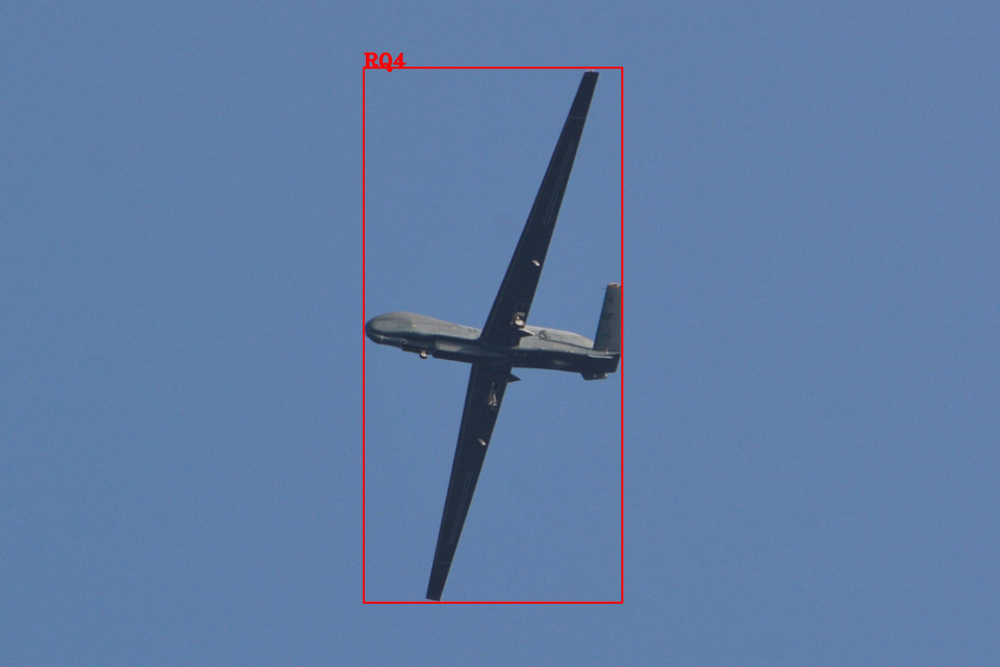

time: 747 ms (started: 2022-02-15 19:19:51 +00:00)


In [ ]:
pil_im = Image.open(os.path.join(ann_dir,s))
display(pil_im)

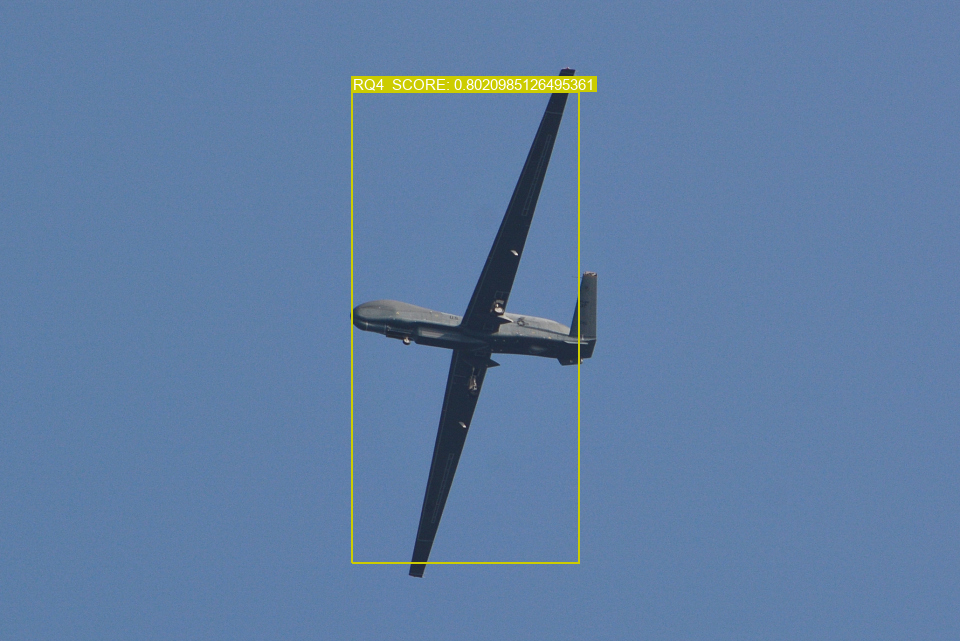

time: 1.07 s (started: 2022-02-15 19:20:43 +00:00)


In [ ]:
# eval_bb(model, image, 0.2)
image = Image.open(os.path.join(images_directory, s))
eval_bb(custom_ssd, image, 0.55)

## Testing on grid

In [ ]:
from urllib import parse
def load_sample(file):
  image = Image.open(file)
  image.load()
  return image
def annotate_box(image, det_boxes, det_labels, det_scores=None):
  draw = ImageDraw.Draw(image)
  font = ImageFont.truetype("arial.ttf", 15)#,encoding="unic"
  if torch.is_tensor(det_scores):
    det_labels = [rev_label_map[l] for l in det_labels.to('cpu').tolist()]
    det_scores = det_scores.to('cpu').tolist()
    for i in range(det_boxes.size(0)):
      box_location = det_boxes[i].to('cpu').tolist()

      if det_labels == ['__background__']:
        print('Nothing detected')
        return image
      
      draw.rectangle(xy=box_location, outline=label_color_map[det_labels[i]])
      draw.rectangle(xy=[l + 1. for l in box_location], outline=label_color_map[det_labels[i]])

      # Text
      fulltext = det_labels[i].upper() + '  SCORE: ' + str(round(det_scores[i], 2))
      text_size = font.getsize(fulltext)
      text_location = [box_location[0] + 2., box_location[1] - text_size[1]]
      textbox_location = [box_location[0], box_location[1] - text_size[1], box_location[0] + text_size[0] + 4.,
                            box_location[1]]
      draw.rectangle(xy=textbox_location, fill=label_color_map[det_labels[i]])
      draw.text(xy=text_location, text=fulltext, fill='white',
                  font=font)
    del draw

    return image
  
  else:
    for i in range(len(det_boxes)):
    
      box_location = det_boxes[i]
      draw.rectangle(xy=box_location, outline=label_color_map[det_labels[i]])
      draw.rectangle(xy=[l + 1. for l in box_location], outline=label_color_map[det_labels[i]])

      # Text
      text_size = font.getsize(det_labels[i].upper())
      text_location = [box_location[0] + 2., box_location[1] - text_size[1]]
      textbox_location = [box_location[0], box_location[1] - text_size[1], box_location[0] + text_size[0] + 4.,
                            box_location[1]]
      draw.rectangle(xy=textbox_location, fill=label_color_map[det_labels[i]])
      draw.text(xy=text_location, text=det_labels[i].upper(), fill='white',
                  font=font)
    del draw

    return image

time: 62.2 ms (started: 2022-02-15 19:20:54 +00:00)


In [ ]:
def display_image_grid(images_filenames, images_directory, labels_directory, model = None, score_threshold = 0.5):
    cols = 2 if model else 1
    rows = len(images_filenames)
    figure, ax = plt.subplots(nrows=rows, ncols=cols, figsize=(24, 24))
    for i, image_filename in enumerate(images_filenames):
        image = load_sample(os.path.join(images_directory, image_filename))
        label = os.path.join(labels_directory, image_filename.replace(".jpg", ".csv"))
        label = pd.read_csv(label, index_col=None, header=0)
        boxes,labels = preprocess_bboxes(label)
        truth = annotate_box(image, boxes, labels)
        if model == None:
          ax[i].imshow(truth)
          ax[i].set_title("Ground truth boxes")
          ax[i].set_axis_off()


        if model:
          ax[i, 0].imshow(truth)
          ax[i, 0].set_title("Ground truth boxes") 
          ax[i, 0].set_axis_off()

          image = load_sample(os.path.join(images_directory, image_filename))
          image_t = trans(image)
          image_t = image_t.to(device)
          image_t = torch.unsqueeze(image_t, 0)

          model.eval()

          output = model(image_t)[0]
          det_boxes = output['boxes'][output['scores'] > score_threshold]
          det_labels = output['labels'][output['scores'] > score_threshold]
          det_scores = output['scores'][output['scores'] > score_threshold]
          if det_scores.nelement() == 0:
            det_scores = 0
          predicted_boxes = annotate_box(image, det_boxes, det_labels, det_scores)
          ax[i, 1].imshow(predicted_boxes)
          ax[i, 1].set_title("Predicted boxes")
          ax[i, 1].set_axis_off()
    plt.tight_layout()
    plt.show()

time: 43.2 ms (started: 2022-02-15 19:20:56 +00:00)


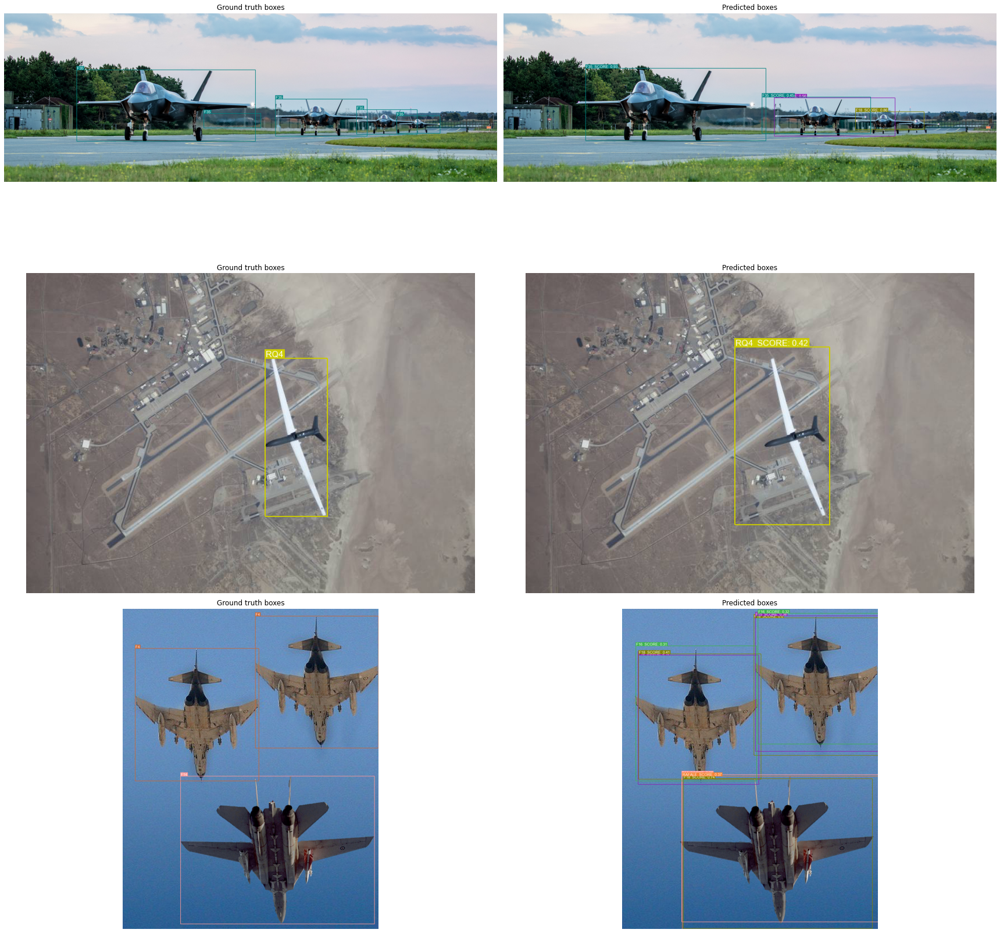

time: 3.02 s (started: 2022-02-15 19:21:12 +00:00)


In [ ]:
display_image_grid(test_images_filenames[:3], images_directory, labels_directory, custom_ssd, score_threshold = 0.3)

## Применение на реальной задачи детектирования в реальном времени

In [ ]:
VIDEO_STREAM = "/content/drive/Othercomputers/Асус учеба/DLS/00. Detection project/opencvtestvid/f35.mp4"
VIDEO_STREAM_OUT = "/content/drive/Othercomputers/Асус учеба/DLS/00. Detection project/opencvtestvid/ssd_plane.webm"  

time: 1.22 ms (started: 2022-02-15 19:51:39 +00:00)


In [111]:
cap = cv2.VideoCapture(VIDEO_STREAM)
fourcc = cv2.VideoWriter_fourcc(*'vp80')
#Setup Video writer
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
fps_vid = cap.get(cv2.CAP_PROP_FPS)

video_writer = cv2.VideoWriter(VIDEO_STREAM_OUT,
                               fourcc,
                               fps_vid, (width, height))
frame_count = 0
total_fps = 0

for frame_idx in range(int(cap.get(cv2.CAP_PROP_FRAME_COUNT))):
    #Read frame
    ret, frame = cap.read()
 
    im_pil = Image.fromarray(frame)

    start_time = time.time()

    results = eval_bb(custom_ssd, im_pil, 0.3)

    cv2image = np.asarray(results)
    end_time = time.time()

    fps = 1 / (end_time - start_time)
    total_fps += fps
    frame_count += 1

    cv2.putText(cv2image, f"{fps:.1f} FPS", 
                (15, 25),
                cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 
                2, lineType=cv2.LINE_AA)

    video_writer.write(cv2image)
#closing windows
cap.release()

#release video writer
video_writer.release()

time: 3min 4s (started: 2022-02-15 20:17:06 +00:00)


Результат

In [112]:
url = upload_public('/content/drive/Othercomputers/Асус учеба/DLS/00. Detection project/opencvtestvid/ssd_plane.webm')
HTML(f"""<video src={url} width=500 controls/>""")

time: 4.12 s (started: 2022-02-15 20:20:11 +00:00)
